<a href="https://colab.research.google.com/github/Mamiglia/challenge/blob/master/baseline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# !mkdir data
# !gdown 1CVAQDuPOiwm8h9LJ8a_oOs6zOWS6EgkB
# !gdown 1ykZ9fjTxUwdiEwqagoYZiMcD5aG-7rHe
# !unzip -o test.zip -d data
# !unzip -o train.zip -d data

# !git clone https://github.com/Mamiglia/challenge.git

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from pathlib import Path
from tqdm import tqdm
import numpy as np
import torch.nn.functional as F 
import heapq

from challenge.src.common import load_data, prepare_train_data, generate_submission
from challenge.src.eval import evaluate_retrieval, visualize_retrieval

In [25]:
# Configuration
MODEL_PATH = "models/mlp_baseline.pth"
EPOCHS = 20
BATCH_SIZE = 512
LR = 0.001
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TOPK=64
SIGMA=0.5

In [4]:
# Load data
train_data = load_data("data/train/train.npz")
X, y, label = prepare_train_data(train_data)

DATASET_SIZE = len(X)
# Split train/val
# This is done only to measure generalization capabilities, you don't have to
# use a validation set (though we encourage this)
n_train = int(0.9 * len(X))
TRAIN_SPLIT = torch.zeros(len(X), dtype=torch.bool)
TRAIN_SPLIT[:n_train] = 1
X_train, X_val = X[TRAIN_SPLIT], X[~TRAIN_SPLIT]
y_train, y_val = y[TRAIN_SPLIT], y[~TRAIN_SPLIT]


train_dataset = TensorDataset(X_train, y_train)
val_dataset = TensorDataset(X_val, y_val)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
y_train.shape[-1], X_val.shape[-1]

(125000,)
Train data: 125000 captions, 125000 images


(1536, 1024)

In [5]:
def build_graph_fast(A_Y, k=20):
    Ay = F.normalize(A_Y.cpu(), dim=-1)
    K = Ay.size(0)
    D = 1 - Ay @ Ay.T                    # [K,K]
    vals, idx = torch.topk(D, k=min(k+1, K), largest=False, dim=-1)
    adj = [[] for _ in range(K)]
    for i in range(K):
        for j, w in zip(idx[i,1:], vals[i,1:]):  # salta se stesso
            j = int(j.item()); w = float(w.item())
            adj[i].append((j, w)); adj[j].append((i, w))
    return adj


In [6]:
# ===============================================================
# ✱ 1️⃣ DIJKSTRA LEGGERO: DISTANZA GEODESICA DA UN NODO A TUTTI
# ===============================================================


def dijkstra_from(src, adj):
    """
    src: indice dell'anchor di partenza
    adj: lista di adiacenza
    ritorna: lista distanze geodetiche approssimate da src a tutti
    """
    N = len(adj)
    dist = [float("inf")] * N
    dist[src] = 0.0
    h = [(0.0, src)]
    while h:
        d, u = heapq.heappop(h)
        if d > dist[u]:
            continue
        for v, w in adj[u]:
            nd = d + w
            if nd < dist[v]:
                dist[v] = nd
                heapq.heappush(h, (nd, v))
    return dist

In [12]:
def zero_shot_translate_geodesic_fast(X, A_X, A_Y, GEO_ALL,
                                      sigma=1.0, topk=64, nearest_k=4):
    """
    Traduzione zero-shot geodetica:
    - Usa stima iniziale euclidea (Y0)
    - Seleziona le nearest_k ancore più vicine in embedding space
    - Propaga distanze geodetiche dal grafo precomputato GEO_ALL
    - Applica kernel gaussiano e centratura
    """
    with torch.no_grad():
        # --- Step 1: Predizione iniziale ---
        Y0 = zero_shot_translate_gaussian(
            X, A_X, A_Y, sigma=sigma, topk=min(64, A_X.size(0))
        )
        Ay  = F.normalize(A_Y, dim=-1)
        Y0n = F.normalize(Y0, dim=-1)
        B, K = Y0n.size(0), Ay.size(0)

        # --- Step 2: trova ancore più vicine ---
        D_seed = torch.cdist(Y0n, Ay)  # [B,K]
        _, idx = torch.topk(D_seed, k=min(nearest_k, K), largest=False, dim=-1)

        # --- Step 3: accumula distanze geodetiche ---
        D_geo = torch.full((B, K), float("inf"), device=X.device)
        GEO = GEO_ALL  # [K,K]

        for b in range(B):
            for k in range(idx.size(1)):
                sel = idx[b, k].item()
                base = torch.norm(Y0n[b] - Ay[sel])  # scalare
                D_geo[b] = torch.minimum(D_geo[b], base + GEO[sel])

        # --- Step 4: top-k mask (opzionale) ---
        if topk is not None and topk < K:
            v, ix = torch.topk(-D_geo, k=topk, dim=-1)
            M = torch.full_like(D_geo, float("inf"))
            M.scatter_(dim=-1, index=ix, src=-v)
            D_geo = M

        # --- Step 5: kernel gaussiano e media pesata ---
        W = torch.exp(-D_geo / (2 * sigma ** 2))
        W = W / (W.sum(dim=-1, keepdim=True) + 1e-8)
        mu_Y = A_Y.mean(dim=0, keepdim=True)
        Y_hat = (W @ (A_Y - mu_Y)) + mu_Y
        return Y_hat


In [ ]:
def farthest_point_sampling(X, m, seed=0):
    # X: [N, D] (torch.FloatTensor, CPU ok), ritorna indici [m]
    rng = np.random.default_rng(seed)
    N = X.shape[0]
    idx0 = int(rng.integers(N))
    chosen = [idx0]
    dist = torch.cdist(X[idx0:idx0+1], X)[0]  # [N]
    for _ in range(1, min(m, N)):
        nxt = int(torch.argmax(dist).item())
        chosen.append(nxt)
        dist = torch.minimum(dist, torch.cdist(X[nxt:nxt+1], X)[0])
    return np.array(chosen, dtype=np.int64)

def build_anchor_pairs(train_data, K=4096, seed=0, strategy="fps"):
    rng = np.random.default_rng(seed)
    img_emb = torch.from_numpy(train_data['images/embeddings']).float()   # [N_img, 1536]
    cap_emb = torch.from_numpy(train_data['captions/embeddings']).float() # [N_cap, 1024]
    cap_lbl = train_data['captions/label']                                 # [N_cap, N_img]

    if strategy == "fps":
        anchor_img_idx = farthest_point_sampling(img_emb.cpu(), K, seed=seed)
    else:
        N_img = img_emb.shape[0]
        anchor_img_idx = rng.choice(N_img, size=min(K, N_img), replace=False)

    anchor_caps_idx = []
    for j in anchor_img_idx:
        rows = np.nonzero(cap_lbl[:, j])[0]
        if len(rows) == 0: continue
        anchor_caps_idx.append(int(rng.choice(rows, size=1)[0]))

    L = min(len(anchor_img_idx), len(anchor_caps_idx))
    anchor_img_idx = anchor_img_idx[:L]
    anchor_caps_idx = anchor_caps_idx[:L]

    A_X = torch.nn.functional.normalize(cap_emb[anchor_caps_idx], dim=-1)  # [K, 1024]
    A_Y = torch.nn.functional.normalize(img_emb[anchor_img_idx], dim=-1)   # [K, 1536]
    return A_X, A_Y, anchor_caps_idx, anchor_img_idx


# ===============================================================
# 2️⃣ Traduttore zero-shot con kernel gaussiano + centratura
# ===============================================================
def zero_shot_translate_gaussian(X, A_X, A_Y, sigma=1.0, topk=TOPK):
    """
    Zero-shot translation con kernel gaussiano euclideo stabile + centratura.
    """
    # Normalizza
    Xn = torch.nn.functional.normalize(X, dim=-1)
    A_Xn = torch.nn.functional.normalize(A_X, dim=-1)

    # Distanze euclidee quadratiche
    D = torch.cdist(Xn, A_Xn, p=2) ** 2  # [B, K]

    # Masking top-k
    if topk is not None and topk < D.shape[1]:
        vals, idx = torch.topk(-D, k=topk, dim=-1)
        D_masked = torch.full_like(D, float('inf'))
        D_masked.scatter_(dim=-1, index=idx, src=-vals)
        D = D_masked

    # Kernel gaussiano
    W = torch.exp(-D / (2 * sigma ** 2))
    W = W / (W.sum(dim=-1, keepdim=True) + 1e-8)

    # Centratura del manifold visivo
    mu_Y = A_Y.mean(dim=0, keepdim=True)
    Y_hat = (W @ (A_Y - mu_Y)) + mu_Y
    return Y_hat

# ===============================================================
# 3️⃣ Correlazione metrica
# ===============================================================
def metric_correlation(Y_hat, Y_true, sample_size=500):
    """
    Calcola la correlazione tra le distanze pairwise in Y_hat e Y_true.
    """
    N = Y_hat.size(0)
    idx = torch.randperm(N)[:sample_size]
    Yh = torch.nn.functional.normalize(Y_hat[idx], dim=-1)
    Yt = torch.nn.functional.normalize(Y_true[idx], dim=-1)

    Dh = torch.cdist(Yh, Yh)
    Dt = torch.cdist(Yt, Yt)

    dh_flat = Dh.flatten().cpu().numpy()
    dt_flat = Dt.flatten().cpu().numpy()

    rho = np.corrcoef(dh_flat, dt_flat)[0,1]
    return rho

# ===============================================================
# 4️⃣ Sweep automatico su σ e topk
# ===============================================================
def sweep_sigma_topk(Xb, Yb, A_X, A_Y, sigmas, topks):
    print(f"{'σ':<8}{'topk':<8}{'cos':<12}{'mse':<12}{'ρ':<12}")
    print("-" * 52)
    for sigma in sigmas:
        for topk in topks:
            with torch.no_grad():
                Y_hat = zero_shot_translate_gaussian(Xb, A_X, A_Y, sigma=sigma, topk=topk)

                cos = torch.nn.functional.cosine_similarity(
                    torch.nn.functional.normalize(Y_hat, dim=-1),
                    torch.nn.functional.normalize(Yb, dim=-1),
                    dim=-1
                ).mean().item()
                
                print("Mean norm pred:", Y_hat.norm(dim=-1).mean().item())
                print("Mean norm true:", Yb.norm(dim=-1).mean().item())
                
                # Calcola la scala globale di norma
                scale = Yb.norm(dim=-1).mean() / Y_hat.norm(dim=-1).mean()
                print(f"Rescaling by factor: {scale:.2f}")

                # Applica la correzione di scala
                Y_hat = Y_hat * scale

                mse = torch.nn.functional.mse_loss(Y_hat, Yb).item()
                rho = metric_correlation(Y_hat, Yb, sample_size=500)
                print(f"{sigma:<8.2f}{topk:<8}{cos:<12.4f}{mse:<12.4f}{rho:<12.4f}")


def sweep_geod_sigma_topk(Xb, Yb,
                          A_X, A_Y, GEO_ALL,
                          sigmas, topks):
    print(f"{'σ':<6}{'topk':<8}{'cos':<10}{'mse':<10}")
    for sigma in sigmas:
        for topk in topks:
            Y_hat = zero_shot_translate_geodesic_fast(
                Xb, A_X, A_Y, GEO_ALL,
                sigma=sigma,
                topk=topk,
                nearest_k=4
            )
            cos = F.cosine_similarity(
                F.normalize(Y_hat, dim=-1),
                F.normalize(Yb, dim=-1),
                dim=-1
            ).mean().item()
            mse = F.mse_loss(Y_hat, Yb).item()
            print(f"{sigma:<6.2f}{topk:<8}{cos:<10.4f}{mse:<10.4f}")



# ===============================================================
# 5️⃣ ESEMPIO D’USO
# ===============================================================


K=1536

A_X, A_Y, caps_idx, imgs_idx = build_anchor_pairs(train_data, K=K, seed=0)
A_X = A_X.to(DEVICE)
A_Y = A_Y.to(DEVICE)

# DOPO
adj = build_graph_fast(A_Y, k=20)
GEO_ALL = torch.tensor(
    [dijkstra_from(i, adj) for i in range(len(adj))],
    dtype=torch.float32,
    device=DEVICE
)
GEODESIC_FN = lambda X: zero_shot_translate_geodesic_fast(
    X, A_X, A_Y, GEO_ALL,
    sigma=SIGMA, topk=TOPK, nearest_k=6
)


Xb, Yb = next(iter(val_loader))
Xb = Xb.to(DEVICE)
Yb = Yb.to(DEVICE)

sigmas = [0.5, 0.8, 1.0, 1.2, 1.5]
topks  = [16, 32, 64, 128]

sweep_geod_sigma_topk(
    Xb, Yb,
    A_X, A_Y, GEO_ALL,
    sigmas, topks
)



σ     topk    cos       mse       
0.50  16      0.7516    0.4157    
0.50  32      0.7597    0.4159    
0.50  64      0.7648    0.4162    
0.50  128     0.7670    0.4165    
0.80  16      0.7468    0.4159    
0.80  32      0.7558    0.4161    
0.80  64      0.7615    0.4163    
0.80  128     0.7644    0.4166    
1.00  16      0.7464    0.4159    
1.00  32      0.7550    0.4161    
1.00  64      0.7611    0.4163    
1.00  128     0.7639    0.4166    
1.20  16      0.7462    0.4159    
1.20  32      0.7547    0.4161    
1.20  64      0.7609    0.4163    
1.20  128     0.7639    0.4166    
1.50  16      0.7458    0.4159    
1.50  32      0.7544    0.4161    
1.50  64      0.7608    0.4164    
1.50  128     0.7637    0.4167    


In [14]:
# ===============================================================
# 6️⃣ Valutazione completa su validation set
# ===============================================================
def orthogonal_procrustes(X, Y):
    U, _, Vt = torch.linalg.svd(X.T @ Y)
    return U @ Vt


with torch.no_grad():
    anchor_pred = GEODESIC_FN(A_X.to(DEVICE)).cpu()

scale_anchor = A_Y.cpu().norm(dim=-1).mean() / anchor_pred.norm(dim=-1).mean()
anchor_pred = anchor_pred * scale_anchor
R = orthogonal_procrustes(anchor_pred, A_Y.cpu())



# Genera predizioni con kernel sharpened
with torch.no_grad():
    z_pred_val = GEODESIC_FN(X_val.to(DEVICE)).cpu()


z_img_val = y_val.cpu()
gt_indices = np.arange(len(z_img_val))

# === CORREZIONI GLOBALI ===
mean_pred = z_pred_val.norm(dim=-1).mean()
mean_true = z_img_val.norm(dim=-1).mean()
scale = mean_true / mean_pred
print(f"🔧 Rescaling embeddings by factor: {scale:.2f}")
z_pred_val = z_pred_val * scale
z_pred_val = z_pred_val @ R
print("🔄 Applied orthogonal alignment (Procrustes)")

Yp_aug = torch.cat([z_pred_val, torch.ones(z_pred_val.size(0), 1)], dim=1)
W = torch.linalg.lstsq(Yp_aug, z_img_val).solution
z_pred_val = Yp_aug @ W

# === EVALUATION ===
results = evaluate_retrieval(
    translated_embd=z_pred_val,
    image_embd=z_img_val,
    gt_indices=gt_indices,
    max_indices=50,
    batch_size=128
)

print("\n=== Retrieval evaluation without training ===")
for k, v in results.items():
    print(f"{k:>12}: {v:.4f}")

🔧 Rescaling embeddings by factor: 34.39
🔄 Applied orthogonal alignment (Procrustes)

=== Retrieval evaluation without training ===
         mrr: 0.2330
        ndcg: 0.3748
 recall_at_1: 0.0870
 recall_at_3: 0.2586
 recall_at_5: 0.4306
recall_at_10: 0.5894
recall_at_50: 0.9012
     l2_dist: 15.4731


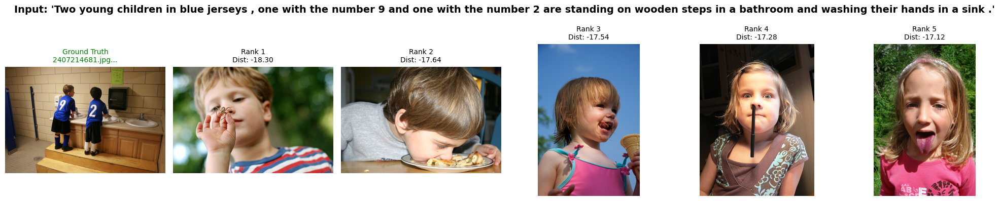

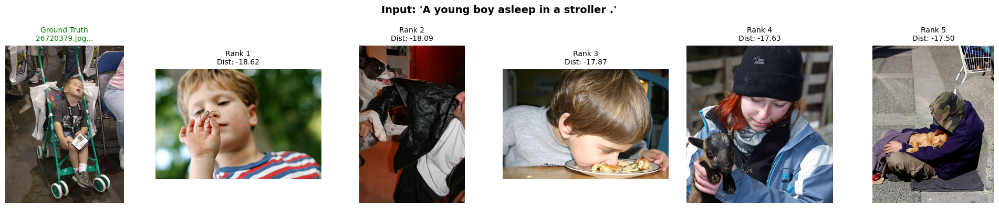

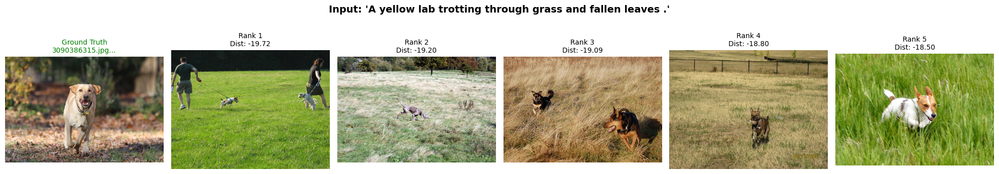

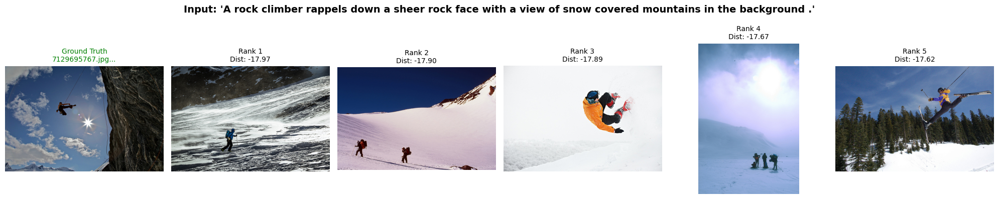

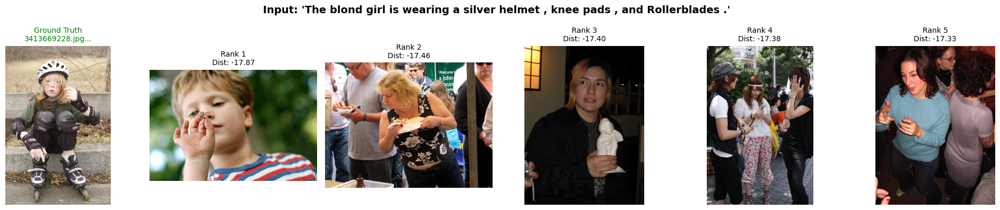

In [15]:
val_caption_text = train_data['captions/text'][~TRAIN_SPLIT]
val_text_embd = X_val
img_VAL_SPLIT = label[~TRAIN_SPLIT].sum(dim=0) > 0
val_img_file = train_data['images/names'][img_VAL_SPLIT]
val_img_embd = torch.from_numpy(train_data['images/embeddings'][img_VAL_SPLIT])
val_label = np.nonzero(train_data['captions/label'][~TRAIN_SPLIT][:,img_VAL_SPLIT])[1]

# Visualizza 5 esempi random
for i in range(5):
    idx = np.random.randint(0, len(val_text_embd))
    caption_embd = val_text_embd[idx:idx+1].to(DEVICE)
    caption_text = val_caption_text[idx]
    gt_index = val_label[idx]

    with torch.no_grad():
        pred_embds = GEODESIC_FN(caption_embd).cpu()

    visualize_retrieval(
        pred_embds,
        gt_index,
        val_img_file,
        caption_text,
        val_img_embd,
        k=5
    )


In [ ]:
class ResidualAdapter(nn.Module):
    def __init__(self, input_dim=1024, output_dim=1536, hidden=4096, dropout=0.1):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim + output_dim, hidden),
            nn.GELU(),
            nn.LayerNorm(hidden),
            nn.Dropout(dropout),
            nn.Linear(hidden, output_dim)  # <-- niente Tanh
        )
    def forward(self, x, geo_pred):
        return geo_pred + self.net(torch.cat([x, geo_pred], dim=-1))


In [17]:
def info_nce_hard(pred, target, temp=0.05, hard_k=32):
    pred_n = F.normalize(pred, dim=-1)
    targ_n = F.normalize(target, dim=-1)
    sim = pred_n @ targ_n.T / temp                       # [B,B]
    mask = torch.eye(sim.size(0), device=sim.device).bool()
    sim_neg = sim.masked_fill(mask, -9e9)
    topk_vals, _ = torch.topk(sim_neg, k=min(hard_k, sim_neg.size(1)-1), dim=1)
    sim_hard = torch.cat([sim.diag().unsqueeze(1), topk_vals], dim=1)
    labels = torch.zeros(sim.size(0), dtype=torch.long, device=sim.device)
    return F.cross_entropy(sim_hard, labels)

def norm_match(pred, target):
    return F.mse_loss(pred.norm(dim=-1), target.norm(dim=-1))


In [ ]:
def residual_loss(Y_pred, Y_true, epoch):
    mse = F.mse_loss(Y_pred, Y_true)
    cos = 1 - F.cosine_similarity(Y_pred, Y_true, dim=-1).mean()
    nce = info_nce_hard(Y_pred, Y_true, temp=0.05, hard_k=32)
    nm  = norm_match(Y_pred, Y_true)
    p_nce = 0.40 * (1 - epoch) + 0.15 * (epoch)
    loss = 0.45*mse + 0.35*cos + p_nce*nce + 0.05*nm
    # stessi pesi in train e in val
    return loss

In [29]:
def train_residual_model_geod(
        model, train_loader, val_loader,
        GEODESIC_FN,
        lr=1e-4, epochs=10, device="cpu"):

    opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=0.05)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        opt, max_lr=4e-4, epochs=epochs, steps_per_epoch=len(train_loader),
        pct_start=0.15, anneal_strategy='cos'
    )
    best_val = float("inf")

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for Xb, Yb in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            Xb, Yb = Xb.to(device), Yb.to(device)

            # 🔵 predizione BASE geodetica on-the-fly
            with torch.no_grad():
                Gb = zero_shot_translate_geodesic_fast(Xb, A_X, A_Y, GEO_ALL,sigma=0.8, topk=128, nearest_k=6)

            Y_pred = model(Xb, Gb)
            loss   = residual_loss(Y_pred, Yb, epoch/epochs)

            opt.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 2.0)
            opt.step()
            scheduler.step()

            train_loss += loss.item()
        train_loss /= len(train_loader)

        # ---- validation geodetica ----
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for Xb, Yb in val_loader:
                Xb, Yb = Xb.to(device), Yb.to(device)
                Gb = zero_shot_translate_geodesic_fast(Xb, A_X, A_Y, GEO_ALL,sigma=0.4, topk=64, nearest_k=6)
                Y_pred = model(Xb, Gb)
                val_loss += residual_loss(Y_pred, Yb,epoch/epochs).item()
        val_loss /= len(val_loader)

        print(f"Epoch {epoch+1}: train={train_loss:.4f} | val={val_loss:.4f}")

        if val_loss < best_val:
            best_val = val_loss
            Path("models").mkdir(exist_ok=True)
            torch.save(model.state_dict(), "models/residual_adapter_best.pth")
            print(f"  ✓ Saved best model (val_loss={val_loss:.4f})")

    return model


In [30]:
# inizializza il modello
model = ResidualAdapter().to(DEVICE)

# addestra
model = train_residual_model_geod(
    model,
    train_loader, val_loader,
    GEODESIC_FN,
    lr=1e-4, epochs=20, device=DEVICE
)

Epoch 1/20: 100%|██████████| 440/440 [03:51<00:00,  1.90it/s]


Epoch 1: train=1.4308 | val=1.6022
  ✓ Saved best model (val_loss=1.6022)


Epoch 2/20: 100%|██████████| 440/440 [04:00<00:00,  1.83it/s]


Epoch 2: train=1.1231 | val=1.3977
  ✓ Saved best model (val_loss=1.3977)


Epoch 3/20: 100%|██████████| 440/440 [04:00<00:00,  1.83it/s]


Epoch 3: train=1.0134 | val=1.2646
  ✓ Saved best model (val_loss=1.2646)


Epoch 4/20: 100%|██████████| 440/440 [04:04<00:00,  1.80it/s]


Epoch 4: train=0.9105 | val=1.2051
  ✓ Saved best model (val_loss=1.2051)


Epoch 5/20: 100%|██████████| 440/440 [04:01<00:00,  1.82it/s]


Epoch 5: train=0.8278 | val=1.1470
  ✓ Saved best model (val_loss=1.1470)


Epoch 6/20: 100%|██████████| 440/440 [03:58<00:00,  1.84it/s]


Epoch 6: train=0.7628 | val=1.1277
  ✓ Saved best model (val_loss=1.1277)


Epoch 7/20: 100%|██████████| 440/440 [04:00<00:00,  1.83it/s]


Epoch 7: train=0.7069 | val=1.0882
  ✓ Saved best model (val_loss=1.0882)


Epoch 8/20: 100%|██████████| 440/440 [04:06<00:00,  1.79it/s]


Epoch 8: train=0.6551 | val=1.0937


Epoch 9/20: 100%|██████████| 440/440 [03:57<00:00,  1.85it/s]


Epoch 9: train=0.6080 | val=1.0419
  ✓ Saved best model (val_loss=1.0419)


Epoch 10/20: 100%|██████████| 440/440 [04:09<00:00,  1.77it/s]


Epoch 10: train=0.5654 | val=1.0002
  ✓ Saved best model (val_loss=1.0002)


Epoch 11/20: 100%|██████████| 440/440 [04:08<00:00,  1.77it/s]


Epoch 11: train=0.5263 | val=0.9862
  ✓ Saved best model (val_loss=0.9862)


Epoch 12/20: 100%|██████████| 440/440 [04:11<00:00,  1.75it/s]


Epoch 12: train=0.4898 | val=0.9510
  ✓ Saved best model (val_loss=0.9510)


Epoch 13/20: 100%|██████████| 440/440 [03:59<00:00,  1.84it/s]


Epoch 13: train=0.4567 | val=0.9339
  ✓ Saved best model (val_loss=0.9339)


Epoch 14/20: 100%|██████████| 440/440 [04:01<00:00,  1.82it/s]


Epoch 14: train=0.4263 | val=0.9091
  ✓ Saved best model (val_loss=0.9091)


Epoch 15/20: 100%|██████████| 440/440 [04:01<00:00,  1.82it/s]


Epoch 15: train=0.3992 | val=0.8730
  ✓ Saved best model (val_loss=0.8730)


Epoch 16/20: 100%|██████████| 440/440 [04:00<00:00,  1.83it/s]


Epoch 16: train=0.3761 | val=0.8417
  ✓ Saved best model (val_loss=0.8417)


Epoch 17/20: 100%|██████████| 440/440 [04:00<00:00,  1.83it/s]


Epoch 17: train=0.3558 | val=0.8038
  ✓ Saved best model (val_loss=0.8038)


Epoch 18/20: 100%|██████████| 440/440 [03:58<00:00,  1.84it/s]


Epoch 18: train=0.3380 | val=0.7760
  ✓ Saved best model (val_loss=0.7760)


Epoch 19/20: 100%|██████████| 440/440 [03:58<00:00,  1.85it/s]


Epoch 19: train=0.3228 | val=0.7428
  ✓ Saved best model (val_loss=0.7428)


Epoch 20/20: 100%|██████████| 440/440 [03:52<00:00,  1.89it/s]


Epoch 20: train=0.3100 | val=0.7112
  ✓ Saved best model (val_loss=0.7112)


In [31]:
with torch.no_grad():
    geo_pred = GEODESIC_FN(X_val.to(DEVICE))
    z_pred_val = model(X_val.to(DEVICE), geo_pred).cpu()


# correzioni metriche
mean_pred = z_pred_val.norm(dim=-1).mean()
mean_true = y_val.norm(dim=-1).mean()
scale = mean_true / mean_pred
z_pred_val *= scale
z_pred_val = z_pred_val @ R

# valutazione
results = evaluate_retrieval(
    translated_embd=z_pred_val,
    image_embd=y_val.cpu(),
    gt_indices=np.arange(len(y_val)),
    max_indices=50,
    batch_size=128
)
for k, v in results.items():
    print(f"{k:>12}: {v:.4f}")


         mrr: 0.3934
        ndcg: 0.5337
 recall_at_1: 0.1688
 recall_at_3: 0.4919
 recall_at_5: 0.8076
recall_at_10: 0.9180
recall_at_50: 0.9929
     l2_dist: 20.9640


mrr: 0.4389

ndcg: 0.5743

recall_at_1: 0.1922

recall_at_3: 0.5670

recall_at_5: 0.9346

recall_at_10: 0.9810

recall_at_50: 0.9996

l2_dist: 21.1326

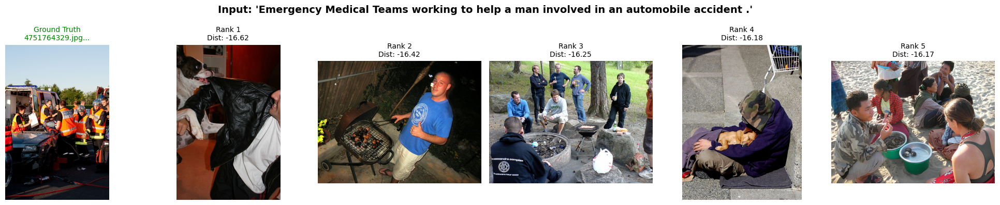

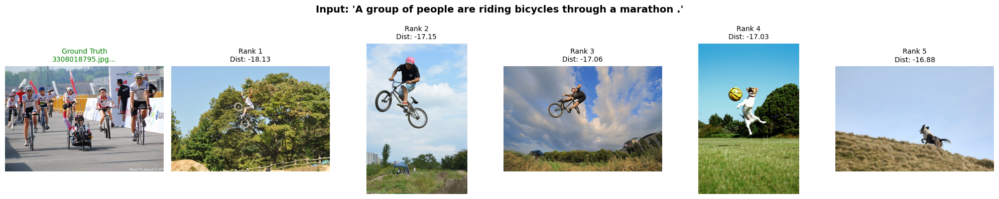

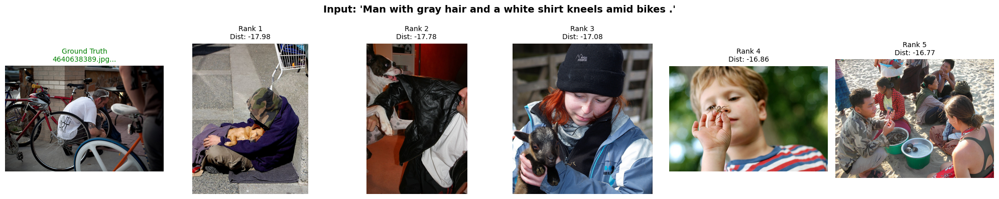

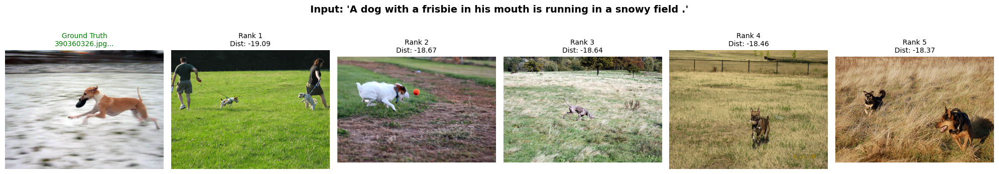

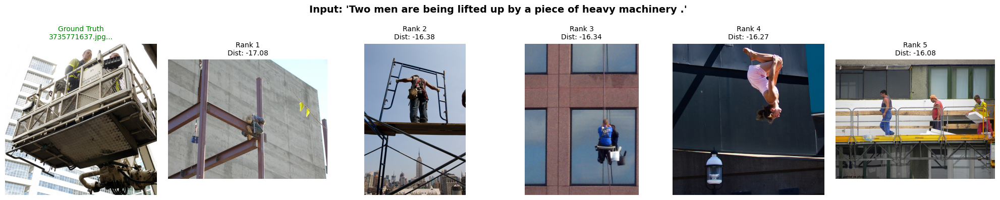

In [32]:
val_caption_text = train_data['captions/text'][~TRAIN_SPLIT]
val_text_embd = X_val
img_VAL_SPLIT = label[~TRAIN_SPLIT].sum(dim=0) > 0
val_img_file = train_data['images/names'][img_VAL_SPLIT]
val_img_embd = torch.from_numpy(train_data['images/embeddings'][img_VAL_SPLIT])
val_label = np.nonzero(train_data['captions/label'][~TRAIN_SPLIT][:,img_VAL_SPLIT])[1]

# Visualizza 5 esempi random
for i in range(5):
    idx = np.random.randint(0, len(val_text_embd))
    caption_embd = val_text_embd[idx:idx+1].to(DEVICE)
    caption_text = val_caption_text[idx]
    gt_index = val_label[idx]

    with torch.no_grad():
        pred_embds = GEODESIC_FN(caption_embd).cpu()

    visualize_retrieval(
        pred_embds,
        gt_index,
        val_img_file,
        caption_text,
        val_img_embd,
        k=5
    )


In [33]:
test_data = load_data("data/test/test.clean.npz")
test_embds = torch.from_numpy(test_data['captions/embeddings']).float()

model = ResidualAdapter().to(DEVICE)
model.load_state_dict(torch.load("models/residual_adapter_best.pth"))
model.eval()

with torch.no_grad():
    geo_pred = GEODESIC_FN(test_embds.to(DEVICE))
    pred_embds = model(test_embds.to(DEVICE), geo_pred).cpu()


# (opzionale) applica la stessa correzione di scala e Procrustes del validation
mean_pred = pred_embds.norm(dim=-1).mean()
scale = (A_Y.norm(dim=-1).mean() / mean_pred).item()  # float puro

pred_embds *= scale
pred_embds = pred_embds @ R 

submission = generate_submission(test_data['captions/ids'], pred_embds, 'submission.csv')
print("✅ Submission saved to: submission.csv")


Generating submission file...
✓ Saved submission to submission.csv
✅ Submission saved to: submission.csv


---